In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.optimize import curve_fit
plt.style.use("dark_background")

$\Large\textit The \ Histogram \ Method$

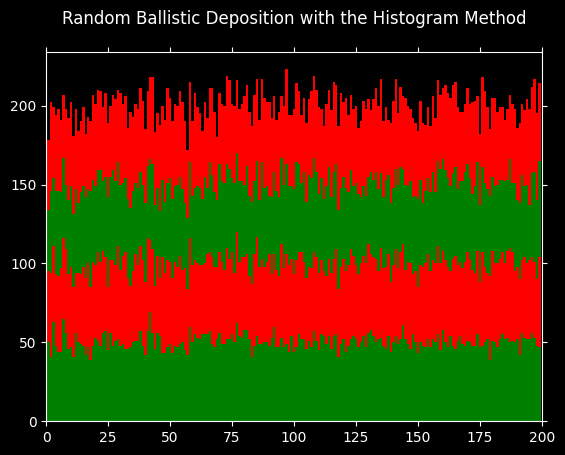

In [2]:
"""
The first algorithm for Random Ballistic Deposition: the Histogram Method.
Basically, this method implements the stacked histogram of 4 sets of data with 200 bins of random heights.
"""


num_bins = 200
# The number of depositions is basically the number of times the clock ticks.
# With each tick of the clock, a random number of particles falls on some random bins.
num_deps = 100

# Generate four layers, basically the height of each bin is determined.
layer1 = np.sum(np.random.randint(2, size=(num_deps, num_bins)), axis=0)
layer2 = np.sum(np.random.randint(2, size=(num_deps, num_bins)), axis=0)
layer3 = np.sum(np.random.randint(2, size=(num_deps, num_bins)), axis=0)
layer4 = np.sum(np.random.randint(2, size=(num_deps, num_bins)), axis=0)


fig, ax = plt.subplots()
ax.clear()
ax.set_xticks(np.arange(0, num_bins+1, step=25))
ax.set_xlim(0, num_bins)

ax.bar(np.arange(num_bins), layer1, color="g", width=1)
ax.bar(np.arange(num_bins), layer2, color="r", width=1, bottom=layer1)
ax.bar(np.arange(num_bins), layer3, color="g", width=1, bottom=layer1+layer2)
ax.bar(np.arange(num_bins), layer4, color="r", width=1, bottom=layer1+layer2+layer3)
ax.set_title("Random Ballistic Deposition with the Histogram Method", pad=20);

In [3]:
# fig.savefig("RBDHistogramMethod.jpg")

$\Large\textit The \ Animation \ Method$

In [4]:
"""
This is the algorithm described in section 3.2 of the text book.
"""
np.random.seed(121)

num_bins = 20
num_particles = 1000
layers = np.zeros((num_particles, num_bins))
for i in range(num_particles):
    bin = np.random.randint(num_bins)  # Choose a bin at random to deposit
    layers[i,bin] = 1

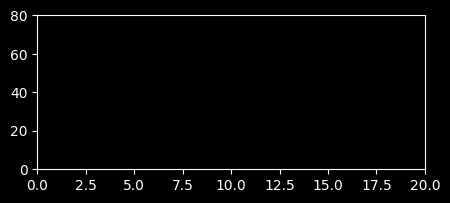

In [5]:
"""
A crude example to work with and try out the algorithm. Only 20 bins and 1000 particles are used.
"""
from matplotlib import animation


plt.close("all")
np.random.seed(121)

# Added the line below from stackoverflow so that jupyter notebook would work.
# Without it, the code runs into an error that I have't quite figured out what exactly it is;
# Best I understand, some encoder (FFMpeg encdoer) is not installed.
plt.rcParams["animation.html"] = "jshtml"

# Descretized space, or equivalently the number of bins the particles can be depositted into:
num_bins = 20
num_particles = 1_000
# Initiating the layers:
layers = np.zeros((num_particles, num_bins))
for i in range(num_particles):
    # At each level, choose a bin at random to deposit 1 particle into.
    bin = np.random.randint(num_bins)
    layers[i,bin] = 1


# Initiating the plot:
fig, ax = plt.subplots(figsize=(5,2))
ax.set_xlim((0, num_bins))
ax.set_ylim((0,(num_particles*1.6)//num_bins));  # the lims were found with trial and error!  num_particles//(10*num_bins)
# ax.set_axis_off()
# Create an empty point object with no data.
# It will be updated during each frame of the animation.
(point,) = ax.plot([], [], "bo", ms=5)

# initialization function: plot the background of each frame.
# There was a similar function in all the example codes I studied; must be the standard way!
def init():
    point.set_data([], [])
    return point,


# Using lists in this example. In the following example, numpy arrays are used.
x = list()
y = list()
cumulative = np.cumsum(layers, axis=0)
# The animation function. This is called sequentially.
def animate(i):
    x.append(np.nonzero(layers[i])[0][0])
    y.append(cumulative[i][x[i]])
    point.set_data(x, y)  # The standard way to update x and y.
    return point,


# Finally moving on to the animator function.
# frames parameter determines the number of particles that are depositted.
# If we add one single particle in each frame, a lot of time and a lot of memory will be used.
# blit=True means only re-draw the parts that have changed; this helps increase the speed of the program.
anim = animation.FuncAnimation(fig, animate, init_func=init, frames=num_particles, blit=True)

In [6]:
anim

In [7]:
plt.rcParams["animation.html"] = "jshtml"
np.random.seed(121)

# Descretized space, or equivalently the number of bins the particles can be depositted into:
num_bins = 200
num_particles = 100_000
# Initiating the layers:
layers = np.zeros((num_particles, num_bins))
for i in range(num_particles):
    # At each level, choose a bin at random to deposit 1 particle into.
    bin = np.random.randint(num_bins)
    layers[i,bin] = 1


# Initiating the plot:
fig, ax = plt.subplots(figsize=(5,2))
ax.set_xlim((0, num_bins))
ax.set_ylim((0,600));  # the limits were found with trial and error!

# Create an empty point object with no data.
# It will be updated during each frame of the animation.
(point,) = ax.plot([], [], "o", color="aqua", ms=1)

# initialization function: plot the background of each frame.
# There was a similar function in all the example codes I studied; must be the standard way!
def init():
    point.set_data([], [])
    return point,


# Numpy arrays are used:
x = np.zeros(num_particles)
y = np.zeros(num_particles)
cumulative = np.cumsum(layers, axis=0)
# The animation function. This is called sequentially.
def animate(i):
    # Adjusting for the first frame that has to be an empty plot:
    if i==0:
        point.set_data(0, 0)
        return point,
    i = i-1
    # 1000 particle are deposited per frame
    for j in range(1000*i, 1000*i+1000):
        x[j] = (np.nonzero(layers[j])[0][0])
        y[j] = cumulative[j][int(x[j])]
    point.set_data(x[:1000*i+1000], y[:1000*i+1000])  # The standard way to update x and y.
    return point,


# Finally moving on to the animator function.
# frames parameter determines the number of particles that are depositted in each frame.
# If we add one single particle in each frame, a lot of time and a lot of memory will be used.
# blit=True means only re-draw the parts that have changed; this helps increase the speed of the program.
anim = animation.FuncAnimation(fig, animate, init_func=init, frames=101, blit=True)
plt.close("all")

In [8]:
anim

In [9]:
# # Saving the animation in mp4:
# dpi = 300
# writer = animation.writers["ffmpeg"](fps=30)
# anim.save("RandomDeposition.mp4",writer=writer,dpi=dpi)

In [10]:
# # Saving the animation in gif:
# writergif = animation.PillowWriter(fps=30)
# anim.save("RandomDeposition.gif",writer=writergif)

$\large Calculating \ the \ Required \ Information \ from \ the \ Deposition \ Model$

In [11]:
"""
Mean height and SD for 4 layers (every 25000 particles):
"""


for i in range(24_999, num_particles, 25_000):
    print(f"mean height after deposition of {i+1} particles: {np.mean(layers.cumsum(axis=0)[i])}")
    print(f"standard deviation after deposition of {i+1} particles: {np.std(layers.cumsum(axis=0)[i])}")
    print("\n\n")

mean height after deposition of 25000 particles: 125.0
standard deviation after deposition of 25000 particles: 12.071453930658063



mean height after deposition of 50000 particles: 250.0
standard deviation after deposition of 50000 particles: 16.208639671483848



mean height after deposition of 75000 particles: 375.0
standard deviation after deposition of 75000 particles: 20.62546969162157



mean height after deposition of 100000 particles: 500.0
standard deviation after deposition of 100000 particles: 24.689268923967756





f:\quera\qenv\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Surface Roughness vs. Time\nFitting of Data')

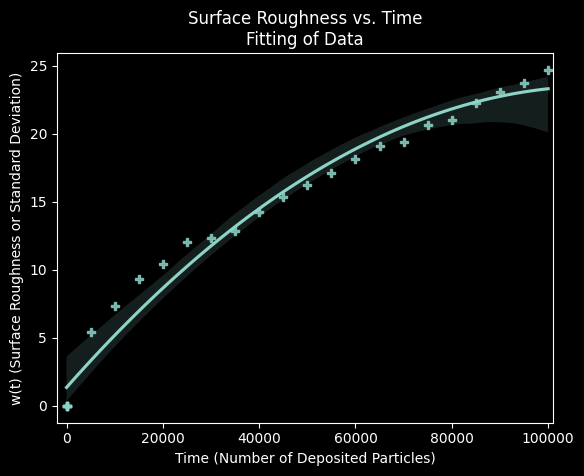

In [15]:
"""
w(t) for 25 layers (every 5000 particles):
"""


x = np.zeros(25)
y = np.zeros(25)

for i in range(4_999, num_particles, 5_000):
    x[int(((i+1)/5_000)-1)] = i
    y[int(((i+1)/5_000)-1)] = np.std(layers.cumsum(axis=0)[i])


fig, ax = plt.subplots()
ax.set_xlim(-2000, num_particles+1000)
sns.regplot(x, y, ax=ax, scatter=True, fit_reg=True, order=2, ci=97, marker="P")
ax.set_xlabel("Time (Number of Deposited Particles)")
ax.set_ylabel("w(t) (Surface Roughness or Standard Deviation)")
ax.set_title("Surface Roughness vs. Time\nFitting of Data")

In [16]:
# fig.savefig("3_1WvsTime.jpg")

In [14]:
"""
Estimating beta in w(t):
"""


# Declaration of the function w(t):
def w_func(t, a, beta):
    return a * (t**beta)


# Fitting data and obtaining beta:
parameters, *rest = curve_fit(w_func, x, y)
print(f"Estimated a = {parameters[0]}\nEstimated beta = {parameters[1]}")

Estimated a = 0.05062643822546406
Estimated beta = 0.5353014086588367
